<a href="https://colab.research.google.com/github/Auvarmf/PKCV/blob/main/Model3CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [47]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 8.9 MB/s eta 0:00:00


In [48]:
import numpy as np
import os
import cv2
import tensorflow as tf
from tqdm import tqdm
import shutil
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import concatenate
from google.colab import drive
from tensorflow.keras.applications import InceptionV3, Xception, DenseNet121
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
from tensorflow.keras.utils import plot_model
import visualkeras

In [12]:
# Mount Google Drive to access files and folders
drive.mount('/content/PKCV')

Drive already mounted at /content/PKCV; to attempt to forcibly remount, call drive.mount("/content/PKCV", force_remount=True).


In [13]:
# Define the base directory where all images are stored
BASE_DIR = '/content/PKCV/MyDrive/PROSUSCV/dataset_butterfly'
train_dir = os.path.join(BASE_DIR, 'train')
val_dir = os.path.join(BASE_DIR, 'validation')
test_dir = os.path.join(BASE_DIR, 'test')

class_names = os.listdir(train_dir)

class_names_label = {class_name: i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)

IMG_SIZE = (299, 299)

In [14]:
def load_data(directory):
    images = []
    labels = []

    for folder in os.listdir(directory):
        if folder in class_names:
            label = class_names.index(folder)

            for file in os.listdir(os.path.join(directory, folder)):
                img_path = os.path.join(os.path.join(directory, folder), file)

                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.webp')):
                    image = cv2.imread(img_path)

                    if image is not None:
                        image = cv2.resize(image, IMG_SIZE)
                        images.append(image)
                        labels.append(label)

    images = np.array(images, dtype="float32")
    labels = np.array(labels, dtype="int32")

    # Shuffle the data using sklearn.utils.shuffle
    images, labels = shuffle(images, labels, random_state=25)

    return images, labels

In [15]:
train_images, train_labels = load_data(train_dir)
test_images, test_labels = load_data(test_dir)

In [16]:
train_images, train_labels = shuffle(train_images, train_labels, random_state=25)

In [17]:
def display_examples(class_names, images, labels):
    figsize = (20, 20)
    fig = plt.figure(figsize=figsize)
    fig.suptitle("Contoh Sampel Dataset", fontsize=16)
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i].astype(np.uint8))
        plt.xlabel(class_names[labels[i]])
    plt.show()

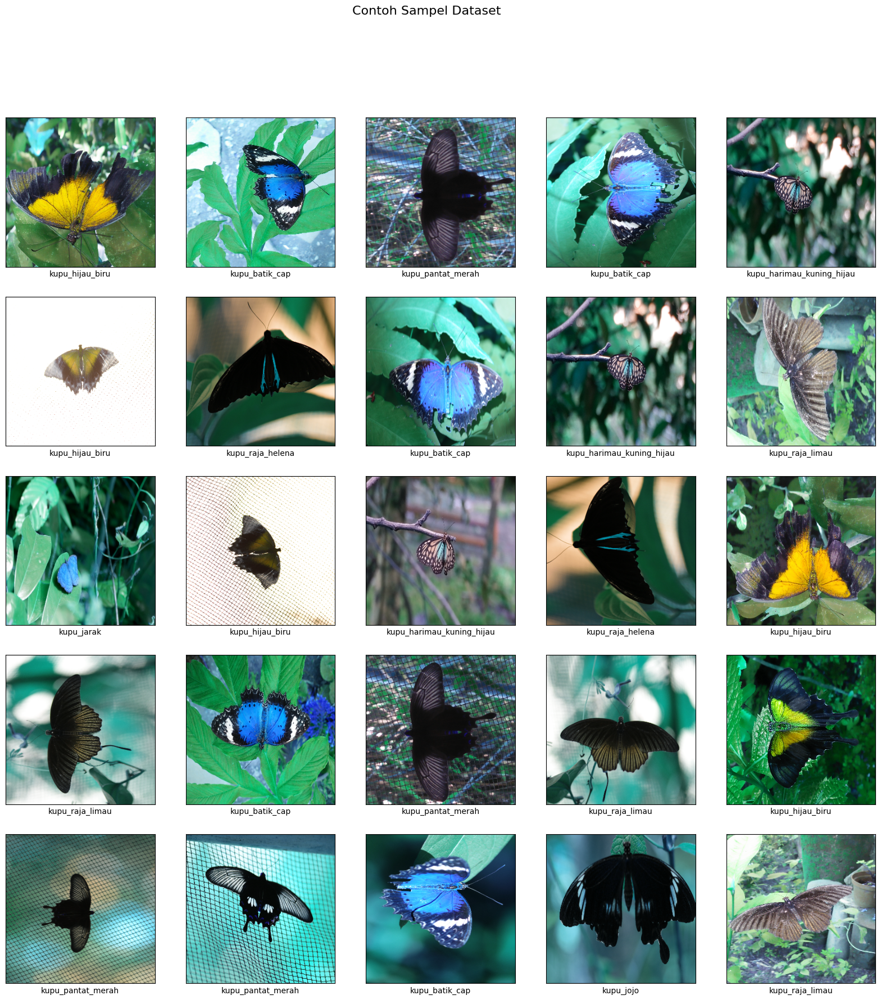

In [18]:
display_examples(class_names, train_images, train_labels)

In [19]:
# Preprocess the images for InceptionV3 and Xception
train_images = tf.keras.applications.inception_v3.preprocess_input(train_images)
test_images = tf.keras.applications.inception_v3.preprocess_input(test_images)

In [20]:
# Define the input shape according to the model
input_shape = IMG_SIZE + (3,)  # For InceptionV3 and Xception

In [21]:
# Define the models
inception_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
googlenet_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
xception_model = Xception(weights='imagenet', include_top=False, input_shape=input_shape)

83683744/83683744 [==============================] - 1s 0us/step


In [22]:
# Freeze the layers
for layer in inception_model.layers:
    layer.trainable = False

for layer in googlenet_model.layers:
    layer.trainable = False

for layer in xception_model.layers:
    layer.trainable = False

In [23]:
# Add custom classifier on top of the models
def build_model(base_model):
    x = base_model.output
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(nb_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

In [24]:
inception_custom_model = build_model(inception_model)
googlenet_custom_model = build_model(googlenet_model)
xception_custom_model = build_model(xception_model)

In [25]:
# Compile the models
inception_custom_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
googlenet_custom_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
xception_custom_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [26]:
# Train the models
inception_history = inception_custom_model.fit(train_images, train_labels, epochs=10, validation_split=0.2, batch_size=32)
googlenet_history = googlenet_custom_model.fit(train_images, train_labels, epochs=10, validation_split=0.2, batch_size=32)
xception_history = xception_custom_model.fit(train_images, train_labels, epochs=10, validation_split=0.2, batch_size=32)

Epoch 1/10
14/14 [==============================] - 206s 14s/step - loss: 49.5854 - accuracy: 0.5670 - val_loss: 3.4892 - val_accuracy: 0.9286
Epoch 2/10
14/14 [==============================] - 185s 13s/step - loss: 1.8676 - accuracy: 0.9509 - val_loss: 1.5951 - val_accuracy: 0.9643
Epoch 3/10
14/14 [==============================] - 173s 13s/step - loss: 0.2603 - accuracy: 0.9888 - val_loss: 3.0047 - val_accuracy: 0.9196
Epoch 4/10
14/14 [==============================] - 187s 14s/step - loss: 0.0811 - accuracy: 0.9955 - val_loss: 1.3936 - val_accuracy: 0.9643
Epoch 5/10
14/14 [==============================] - 184s 13s/step - loss: 0.0184 - accuracy: 0.9955 - val_loss: 1.1053 - val_accuracy: 0.9821
Epoch 6/10
14/14 [==============================] - 173s 13s/step - loss: 7.9828e-10 - accuracy: 1.0000 - val_loss: 1.1391 - val_accuracy: 0.9732
Epoch 7/10
14/14 [==============================] - 174s 13s/step - loss: 5.3218e-10 - accuracy: 1.0000 - val_loss: 1.2696 - val_accuracy: 0.97

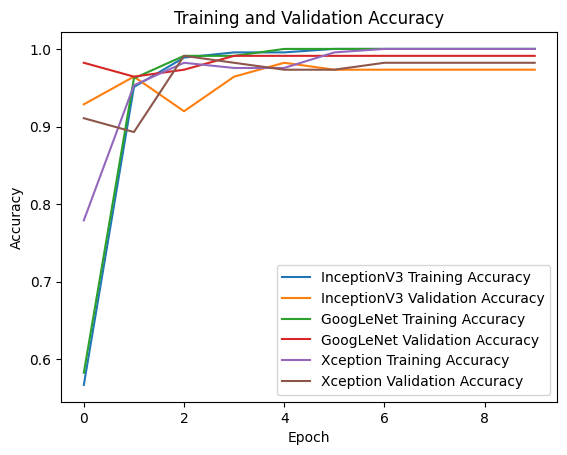

In [27]:
# Plot the training history
plt.plot(inception_history.history['accuracy'], label='InceptionV3 Training Accuracy')
plt.plot(inception_history.history['val_accuracy'], label='InceptionV3 Validation Accuracy')
plt.plot(googlenet_history.history['accuracy'], label='GoogLeNet Training Accuracy')
plt.plot(googlenet_history.history['val_accuracy'], label='GoogLeNet Validation Accuracy')
plt.plot(xception_history.history['accuracy'], label='Xception Training Accuracy')
plt.plot(xception_history.history['val_accuracy'], label='Xception Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [28]:
# Save the models
inception_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/inception_custom_model.h5')
googlenet_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/googlenet_custom_model.h5')
xception_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/xception_custom_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [39]:
# Summarize models
print("InceptionV3 Model Summary:")
inception_custom_model.summary()
plot_model(inception_custom_model, show_shapes=True, to_file='inception_module.png')

InceptionV3 Model Summary:
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0        

GoogLeNet Model Summary:
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 305, 305, 3)          0         ['input_2[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 150, 150, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 150, 150, 64)         256      

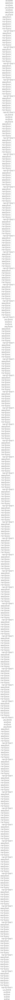

In [40]:
print("GoogLeNet Model Summary:")
googlenet_custom_model.summary()
plot_model(googlenet_custom_model, show_shapes=True, to_file='googlenet_module.png')

Xception Model Summary:
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 149, 149, 32)         864       ['input_3[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 149, 149, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 149, 149, 32)         0         

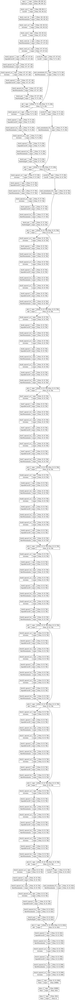

In [41]:
print("Xception Model Summary:")
xception_custom_model.summary()
plot_model(xception_custom_model, show_shapes=True, to_file='xception_module.png')

5/5 [==============================] - 67s 12s/step


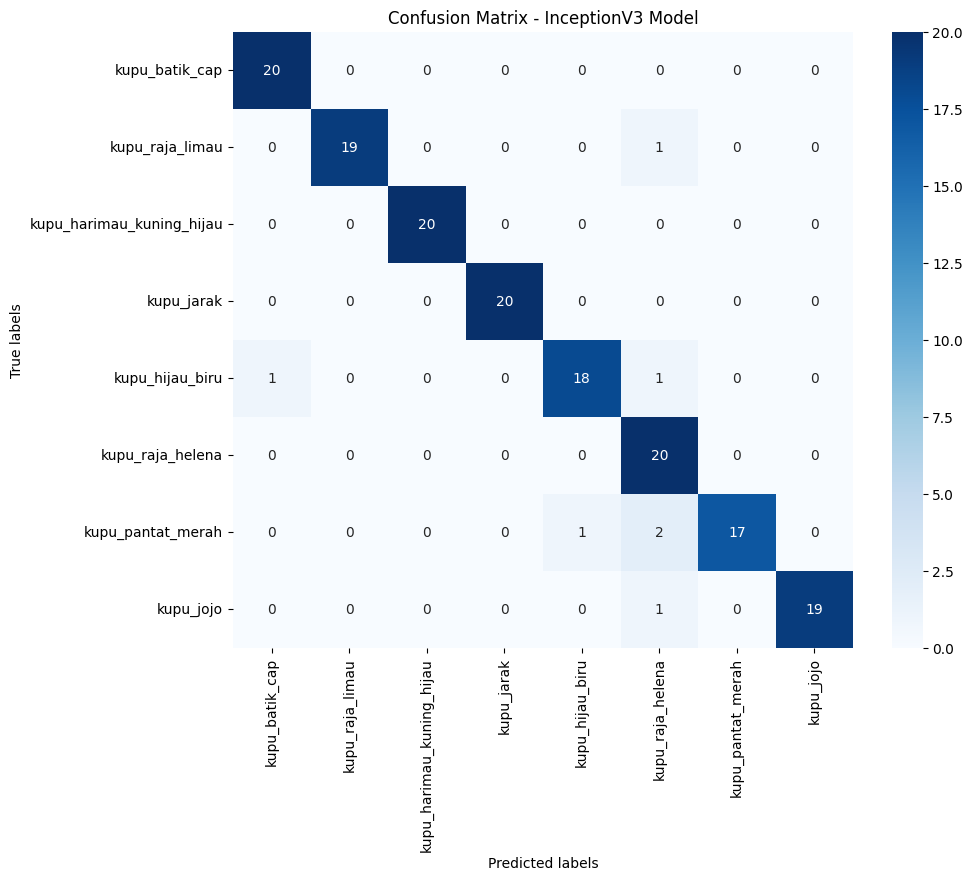

In [32]:
# Plot confusion matrix for InceptionV3 model
inception_predictions = inception_custom_model.predict(test_images)
inception_predictions_labels = np.argmax(inception_predictions, axis=1)
inception_conf_matrix = confusion_matrix(test_labels, inception_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(inception_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - InceptionV3 Model')
plt.show()

5/5 [==============================] - 55s 11s/step


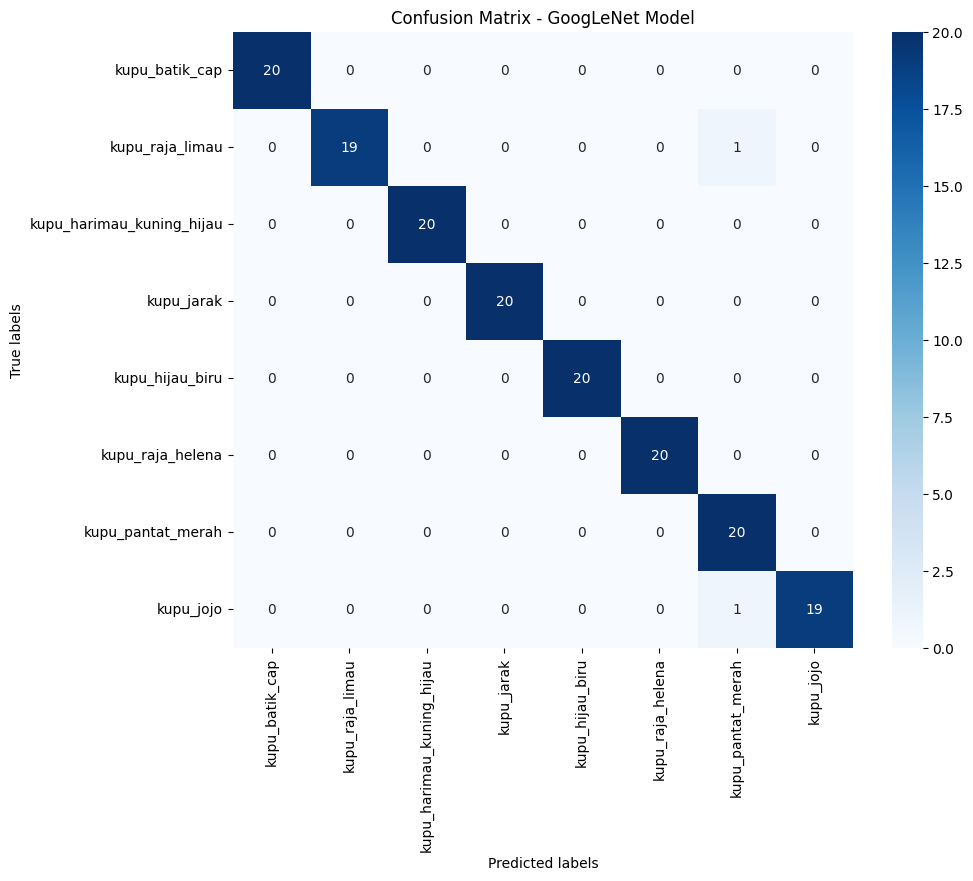

In [33]:
# Plot confusion matrix for GoogLeNet model
googlenet_predictions = googlenet_custom_model.predict(test_images)
googlenet_predictions_labels = np.argmax(googlenet_predictions, axis=1)
googlenet_conf_matrix = confusion_matrix(test_labels, googlenet_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(googlenet_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - GoogLeNet Model')
plt.show()

5/5 [==============================] - 104s 18s/step


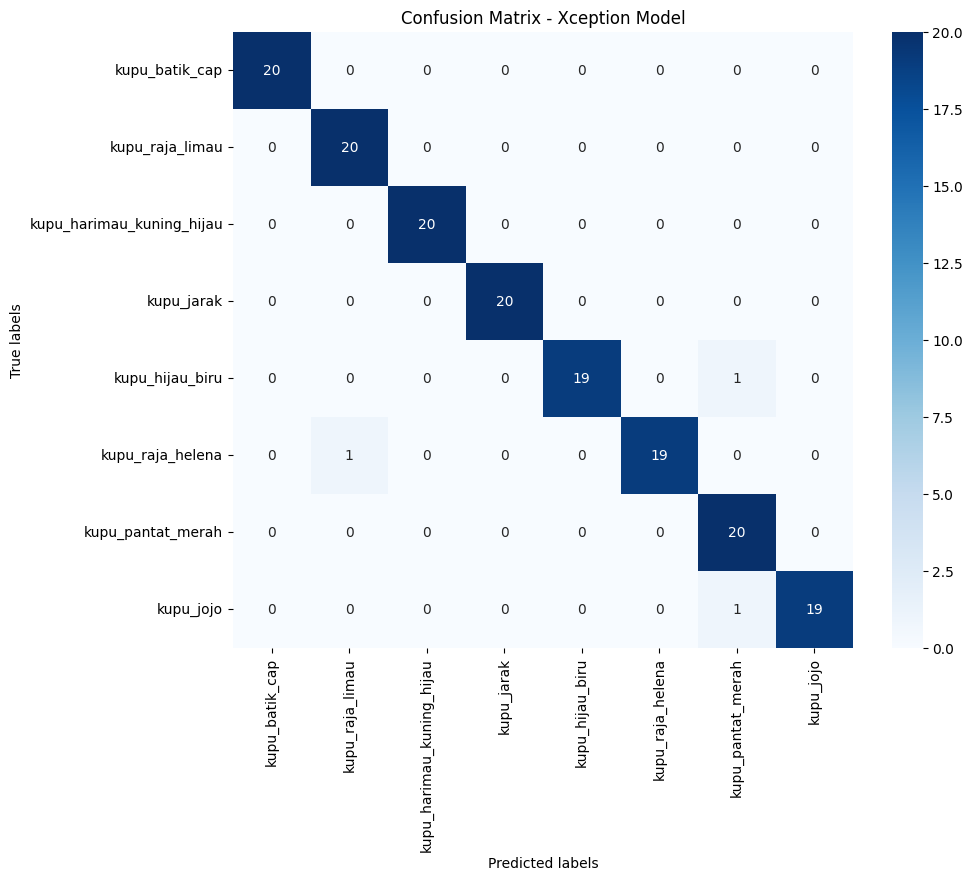

In [34]:
# Plot confusion matrix for Xception model
xception_predictions = xception_custom_model.predict(test_images)
xception_predictions_labels = np.argmax(xception_predictions, axis=1)
xception_conf_matrix = confusion_matrix(test_labels, xception_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(xception_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - Xception Model')
plt.show()


In [49]:
# Visualize models
visualkeras.layered_view(inception_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/inception_custom_model_layers.png').show()
visualkeras.layered_view(googlenet_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/googlenet_custom_model_layers.png').show()
visualkeras.layered_view(xception_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/xception_custom_model_layers.png').show()